In [ ]:
# Are these installs necessary?
# !pip install -q rasterio
# !pip install -q tiler
# !pip install geemap

## SAVE!!

In [ ]:
# Imports
import pathlib
import numpy as np
import os
import datetime
import itertools
import tensorflow_hub as hub
import pandas as pd
import tensorflow as tf
from tensorflow.keras import layers
from tensorflow import keras
import seaborn as sns
import matplotlib.pyplot as plt
import cv2
# import rasterio as rio
from tqdm import tqdm
# import geemap


In [ ]:
# This following line of code is a shell command executed within the notebook. It uses the '!' prefix to run a command as if it were in the terminal.
!nvidia-smi

# The 'nvidia-smi' command stands for NVIDIA System Management Interface. It is used to query and manage NVIDIA GPU devices.
# Running this command displays information about the GPUs on your system, including utilization, memory usage, driver version, and more.

Wed Jul  3 14:34:10 2024       
+---------------------------------------------------------------------------------------+
| NVIDIA-SMI 535.104.05             Driver Version: 535.104.05   CUDA Version: 12.2     |
|-----------------------------------------+----------------------+----------------------+
| GPU  Name                 Persistence-M | Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp   Perf          Pwr:Usage/Cap |         Memory-Usage | GPU-Util  Compute M. |
|                                         |                      |               MIG M. |
|=========================================+======================+======================|
|   0  Tesla T4                       Off | 00000000:00:04.0 Off |                    0 |
| N/A   40C    P8               9W /  70W |      0MiB / 15360MiB |      0%      Default |
|                                         |                      |                  N/A |
+-----------------------------------------+----------------------+--

In [ ]:
# Mount Google Drive to access your data in your defined directory path
from google.colab import drive
drive.mount('/content/drive')
DIR_GDRIVE='/content/drive/MyDrive/AngolaTrainingData'

# Set the AUTOTUNE option for automatic optimization and print the Tensorflow version
AUTO = tf.data.experimental.AUTOTUNE
print(f"Tensorflow version that is currently being used: {tf.__version__}")

Mounted at /content/drive
Tensorflow version that is currently being used: 2.15.0


In [ ]:
# Initialize TPU if data is stored in the cloud
tpu = None

if tpu:
  # If TPU is initialized, shut down the TPU system
  tf.tpu.experimental.shutdown_tpu_system(tpu)

try:
  # Attempt to detect and initialize a TPU
  tpu = tf.distribute.cluster_resolver.TPUClusterResolver() # TPU detection
  tf.config.experimental_connect_to_cluster(tpu)
  tf.tpu.experimental.initialize_tpu_system(tpu)
  strategy = tf.distribute.experimental.TPUStrategy(tpu)
except ValueError:
  # If no TPU is found, fall back to default strategy for CPU or single GPU
  strategy = tf.distribute.get_strategy() # default strategy for CPU and single GPU

In [ ]:
model_name = "efficientnetv2-xl-21k"

# Map model names to their TensorFlow Hub URLs and required image sizes
model_handle_map = {model_name: "https://tfhub.dev/google/imagenet/efficientnet_v2_imagenet21k_xl/feature_vector/2"}
model_image_size_map = {model_name: 512}

# Get the model URL and input image size for the selected model
model_handle = model_handle_map.get(model_name)
pixels = model_image_size_map.get(model_name, 224)
IMAGE_SIZE = (pixels, pixels)
BATCH_SIZE = 16

print(f"Selected model: {model_name} : {model_handle}")
print(f"Input size {IMAGE_SIZE}")

Selected model: efficientnetv2-xl-21k : https://tfhub.dev/google/imagenet/efficientnet_v2_imagenet21k_xl/feature_vector/2
Input size (512, 512)


In [ ]:
def build_dataset(subset):
  return tf.keras.preprocessing.image_dataset_from_directory(
      data_dir,
      validation_split=.20,
      subset=subset,
      label_mode="categorical",
      seed=123,
      image_size=IMAGE_SIZE,
      batch_size=1)

data_dir = r'/content/drive/MyDrive/AngolaTrainingData/AngolaFullTraining'

train_ds_r = build_dataset("training")
class_names = tuple(train_ds_r.class_names)
# train_ims = np.concatenate([y for x, y in train_ds_r], axis=0)

train_size = train_ds_r.cardinality().numpy()
train_ds_r = train_ds_r.unbatch().batch(BATCH_SIZE)
train_ds_r = train_ds_r.repeat()

normalization_layer = tf.keras.layers.Rescaling(1.5 / 255)
preprocessing_model = tf.keras.Sequential([normalization_layer])
do_data_augmentation = True

if do_data_augmentation:
  preprocessing_model.add(
      tf.keras.layers.RandomRotation(40))
  preprocessing_model.add(
      tf.keras.layers.RandomZoom(0.2, 0.2))
  preprocessing_model.add(
      tf.keras.layers.RandomFlip(mode="horizontal"))
  preprocessing_model.add(
      tf.keras.layers.RandomFlip(mode="vertical"))
train_ds = train_ds_r.map(lambda images, labels:
                        (preprocessing_model(images), labels))

val_ds = build_dataset("validation")
valid_size = val_ds.cardinality().numpy()
val_ds = val_ds.unbatch().batch(BATCH_SIZE)
val_ds = val_ds.map(lambda images, labels:
                    (normalization_layer(images), labels))

Found 382 files belonging to 3 classes.
Using 306 files for training.
Found 382 files belonging to 3 classes.
Using 76 files for validation.


In [ ]:
plt.figure(figsize=(15, 15))
for images, labels in train_ds.take(1):
    for i in range(16):
        ax = plt.subplot(4, 4, i + 1)
        plt.imshow(images[i].numpy())
        plt.title(np.argmax(labels[i].numpy()))
        plt.axis("off")

In [ ]:
plt.figure(figsize=(15, 15))
for images, labels in val_ds.take(1):
    for i in range(16):
        ax = plt.subplot(4, 4, i + 1)
        plt.imshow(images[i].numpy())
        plt.title(np.argmax(labels[i].numpy()))
        plt.axis("off")

In [ ]:
do_fine_tuning = False
print("Building model with", model_handle)
model = tf.keras.Sequential([
    tf.keras.layers.InputLayer(input_shape=IMAGE_SIZE + (3,)),
    hub.KerasLayer(model_handle, trainable=do_fine_tuning),
    tf.keras.layers.Dropout(rate=0.3),
    tf.keras.layers.Dense(len(class_names),
    kernel_regularizer=tf.keras.regularizers.l2(0.0001))
])
model.build((None,)+IMAGE_SIZE+(3,))
model.summary()

In [ ]:
model.compile(
  optimizer=tf.keras.optimizers.SGD(learning_rate=0.005, momentum=0.9),
  loss=tf.keras.losses.CategoricalCrossentropy(from_logits=True, label_smoothing=0.1),
  metrics=['accuracy'])

In [ ]:
# from sklearn.utils import class_weight
# class_weights = class_weight.compute_class_weight('balanced',np.unique(np.ravel(train_ims,order='C')),
#                                                  np.ravel(train_ims,order='C'))

In [ ]:
steps_per_epoch = train_size // BATCH_SIZE
validation_steps = valid_size // BATCH_SIZE
hist = model.fit(
    train_ds,
    epochs=300, steps_per_epoch=steps_per_epoch,
    validation_data=val_ds,
    validation_steps=validation_steps).history

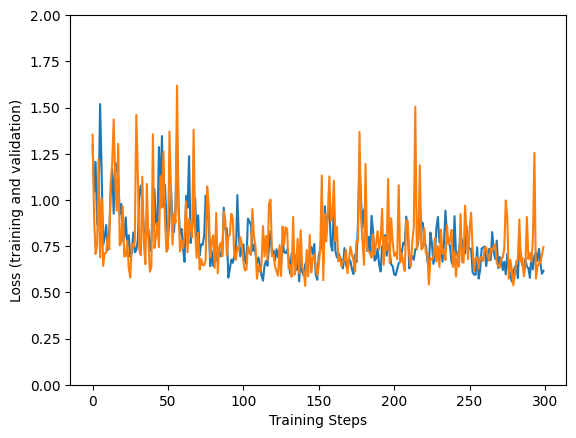

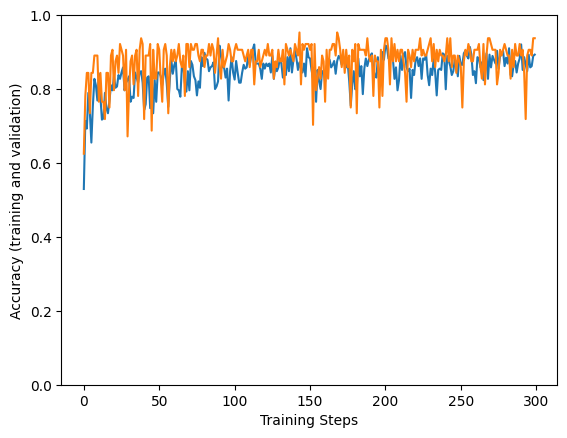

In [ ]:
plt.figure()
plt.ylabel("Loss (training and validation)")
plt.xlabel("Training Steps")
plt.ylim([0,2])
plt.plot(hist["loss"])
plt.plot(hist["val_loss"])

plt.figure()
plt.ylabel("Accuracy (training and validation)")
plt.xlabel("Training Steps")
plt.ylim([0,1])
plt.plot(hist["accuracy"])
plt.plot(hist["val_accuracy"])

In [ ]:
hist_df = pd.DataFrame(hist)

In [ ]:
hist_df.to_csv('/content/drive/MyDrive/AngolaTrainingData/hist_EffNetV2_retrainedAngola_3class.csv')

In [ ]:
model.save('/content/drive/MyDrive/AngolaTrainingData/model_EffNetV2_retrainedAngola_3class.h5')

### TESTING

In [ ]:
model = keras.models.load_model(r'/content/drive/MyDrive/AngolaTrainingData/model_EffNetV2_retrainedAngola_3class.h5',
       custom_objects={'KerasLayer':hub.KerasLayer})

IMAGE_SIZE = (512, 512)
normalization_layer = tf.keras.layers.Rescaling(1.5 / 255)

In [ ]:
from sklearn.metrics import confusion_matrix, accuracy_score

test_dataset = tf.keras.utils.image_dataset_from_directory(
    '/content/drive/MyDrive/AngolaTrainingData/testing3class',
    image_size=IMAGE_SIZE,
    batch_size=25,
    shuffle = True
)
test_dataset = test_dataset.map(lambda images, labels:
                    (normalization_layer(images), labels))

test_labels = []
test_predictions = []
for images, labels in test_dataset:
    batch_predictions = model.predict(images)
    test_labels.extend(labels)
    test_predictions.extend(np.argmax(batch_predictions, axis=1))

acc = accuracy_score(test_labels, test_predictions)
cm = confusion_matrix(test_labels, test_predictions)

print(f'Test Accuracy: {acc}')
print(f'Confusion Matrix: {cm}')


Found 109 files belonging to 3 classes.
1/1 [==============================] - 1s 648ms/step
Test Accuracy: 0.8807339449541285
Confusion Matrix: [[60  1  0]
 [ 6 26  0]
 [ 5  1 10]]


1/1 [==============================] - 0s 239ms/step


1/1 [==============================] - 0s 223ms/step


1/1 [==============================] - 0s 223ms/step


1/1 [==============================] - 0s 225ms/step


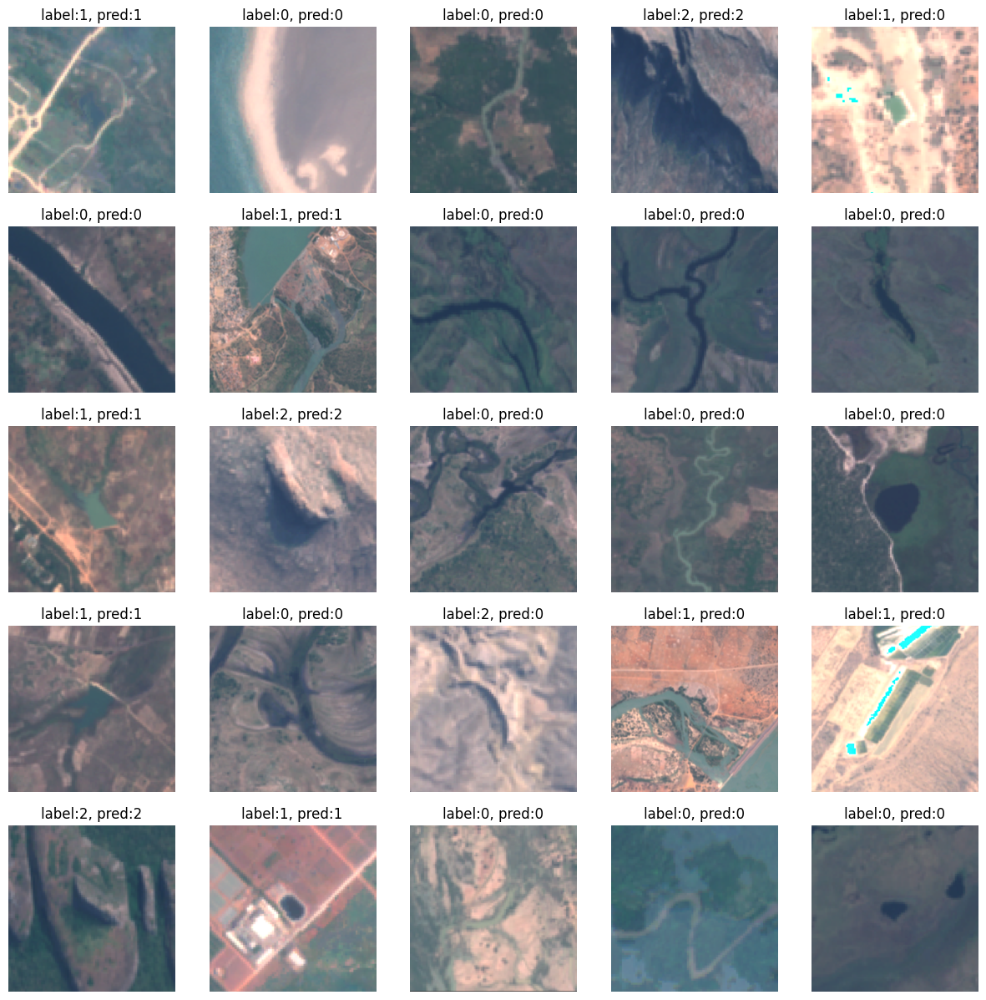

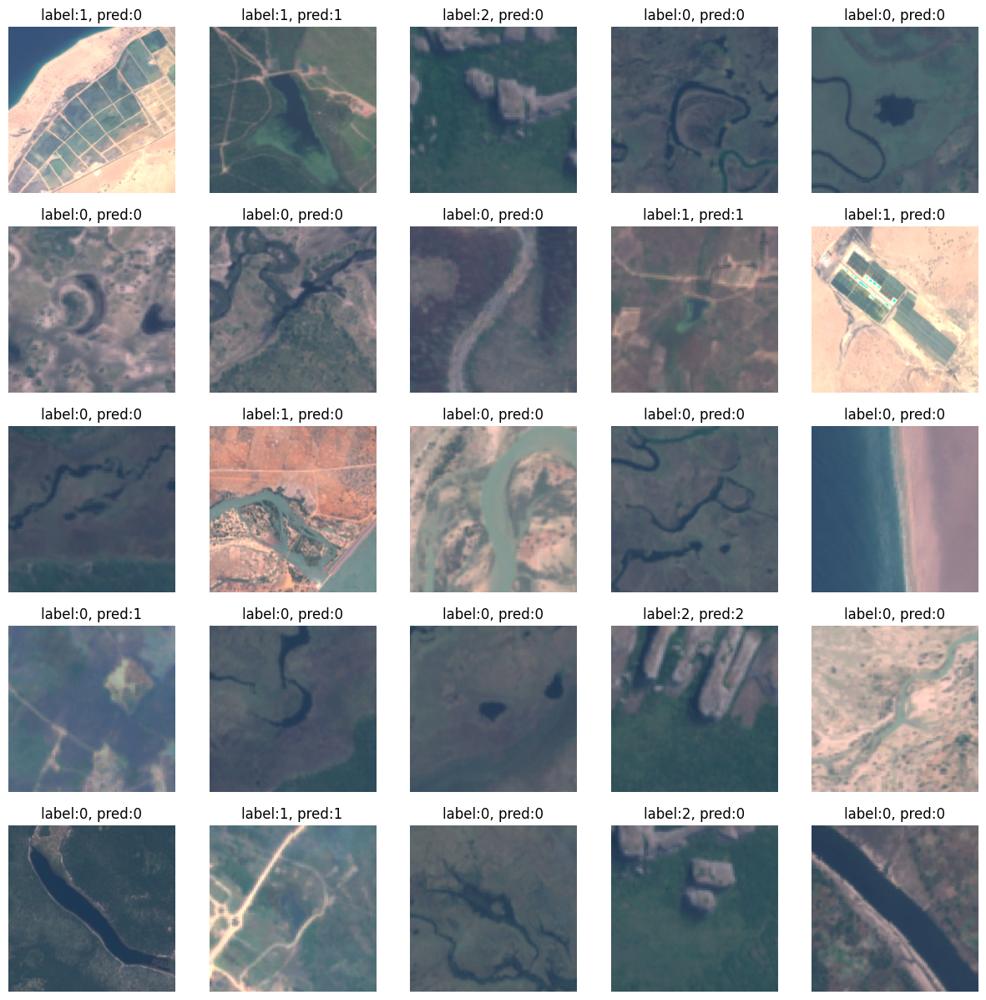

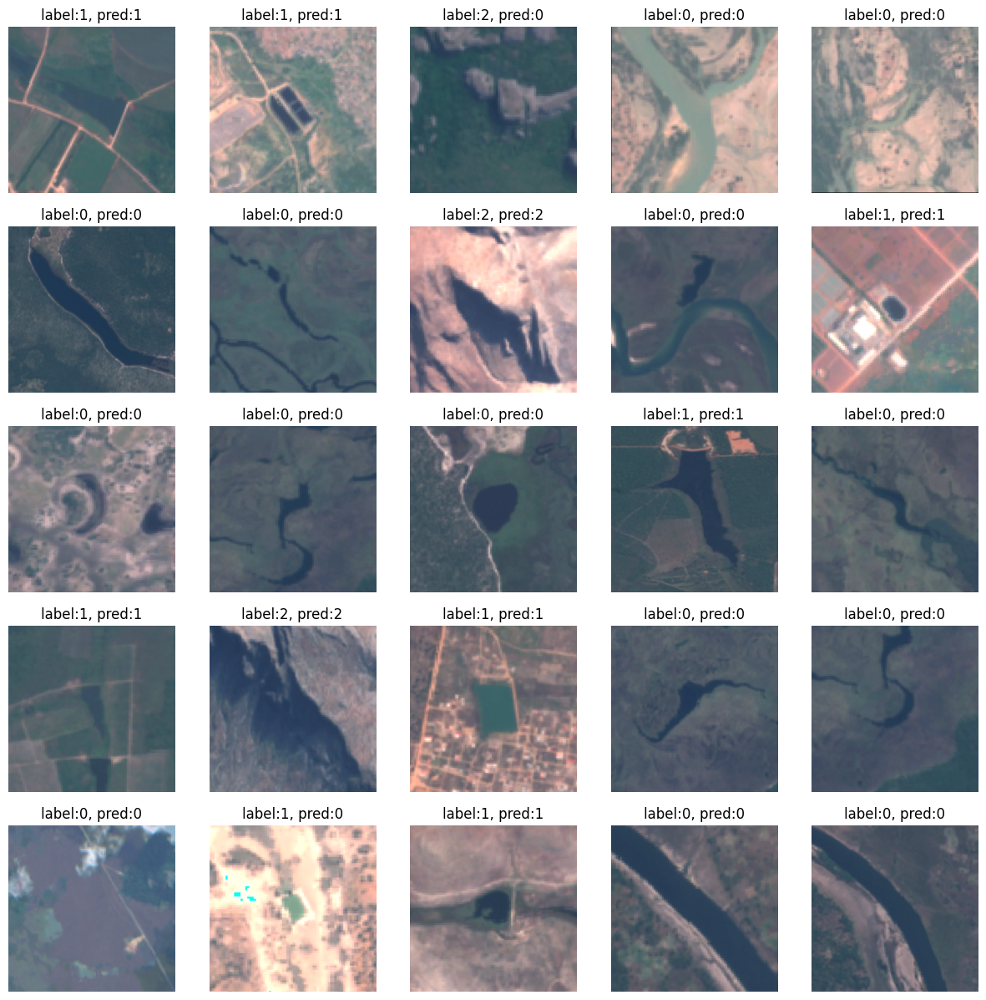

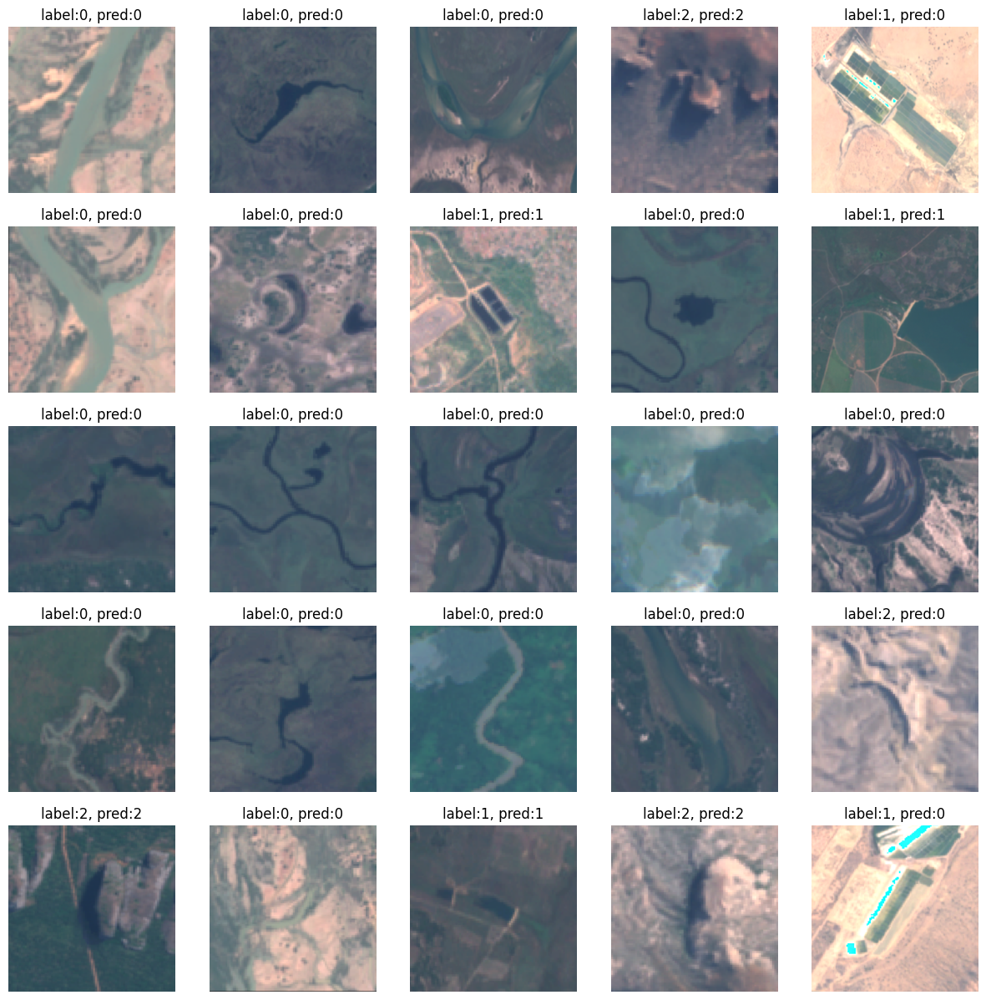

In [ ]:
for j in range(4):

  plt.figure(figsize=(15, 15))
  for images, labels in test_dataset.take(1):
      y_pred = model.predict(images)
      y_pred_binary = np.argmax(y_pred, axis = 1)

      for i in range(25):
          ax = plt.subplot(5, 5, i + 1)
          plt.imshow(images[i].numpy())
          plt.title('label:{}, pred:{}'.format(int(labels[i]), y_pred_binary[i]))
          plt.axis("off")

In [ ]:
print('hello antoniolio')

hello antoniolio


In [ ]:
# blob_dir = '../dataset/classification/angolaprocessing'
# blob_filename = 'blobdetected_angola_filteredPolys.geojson'
# blob_pred_filename = 'blobpredicted_angola_filteredPolys.geojson'

# blob_file = os.path.join(blob_dir, blob_filename)
# blob_data = gpd.read_file(blob_file)
# blob_data['id'] = blob_data['id'].astype(str)

### INFERENCE

In [ ]:
test_dataset = tf.keras.utils.image_dataset_from_directory(
    r'/content/drive/MyDrive/AngolaTrainingData/AngolaPNGsZoom',
    image_size=IMAGE_SIZE,
    batch_size=20,
    shuffle = False,
    label_mode=None,
    labels=None)

file_names = [os.path.basename(name) for name in test_dataset.file_paths]

test_dataset = test_dataset.map(lambda images:
                    (normalization_layer(images)))

Found 18827 files belonging to 1 classes.


In [ ]:
predictions = model.predict(test_dataset)

942/942 [==============================] - 1334s 1s/step


In [ ]:
y_pred = np.argmax(predictions, axis = 1)

In [ ]:
!pip install --upgrade geopandas
import geopandas as gpd
blob_data = gpd.read_file(r'/content/drive/MyDrive/AngolaTrainingData/blobdetected_angola_blobs_filtered_full.geojson')
blob_data['id'] = blob_data['id'].astype(str)

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.1/1.1 MB 50.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 7.8/7.8 MB 106.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 16.1/16.1 MB 86.9 MB/s eta 0:00:00


In [ ]:
img_ids = np.array([line.split('_')[1].split('.')[0] for line in file_names])
df_img = pd.DataFrame()
df_img['id'] = img_ids.astype(str)
df_img['prediction'] = y_pred

blob_pred = pd.merge(blob_data, df_img, on='id')
blob_pred.to_file(r'/content/drive/MyDrive/AngolaTrainingData/blobpredicted_angola_blobs_filtered_full.geojson', driver='GeoJSON')

1/1 [==============================] - 0s 209ms/step


1/1 [==============================] - 0s 180ms/step


1/1 [==============================] - 0s 182ms/step


1/1 [==============================] - 0s 181ms/step


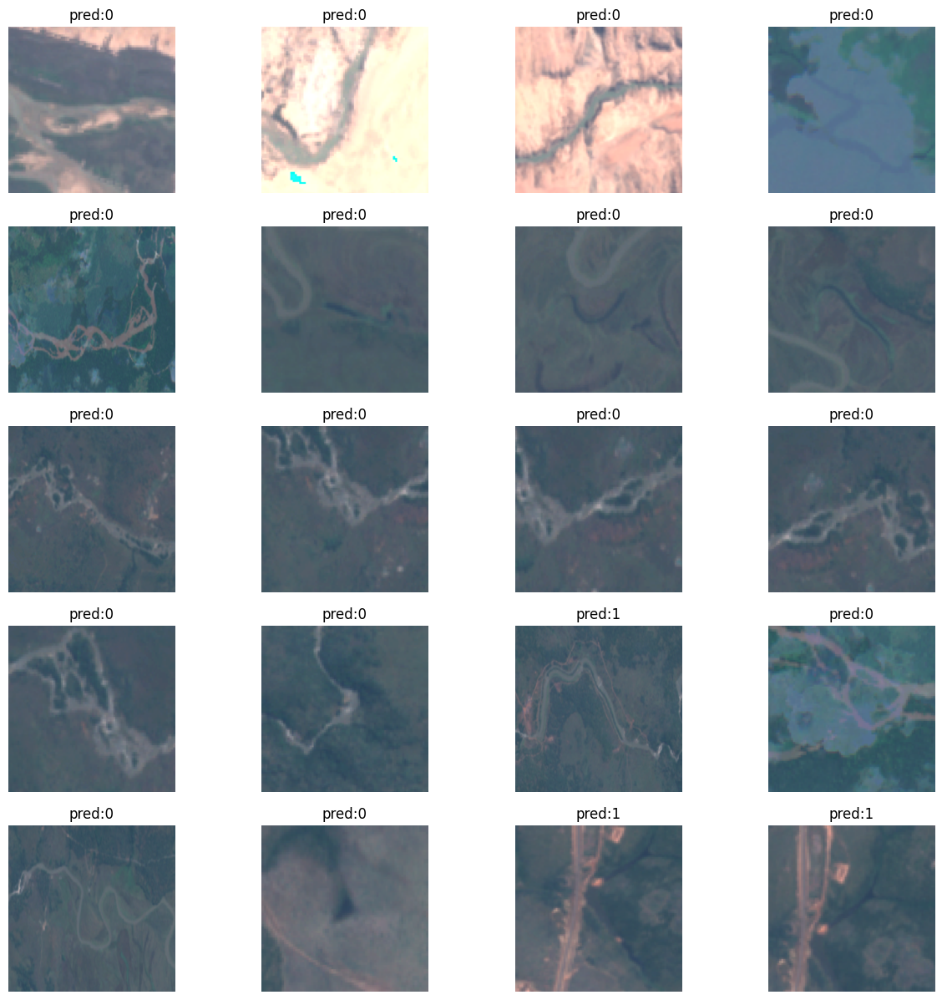

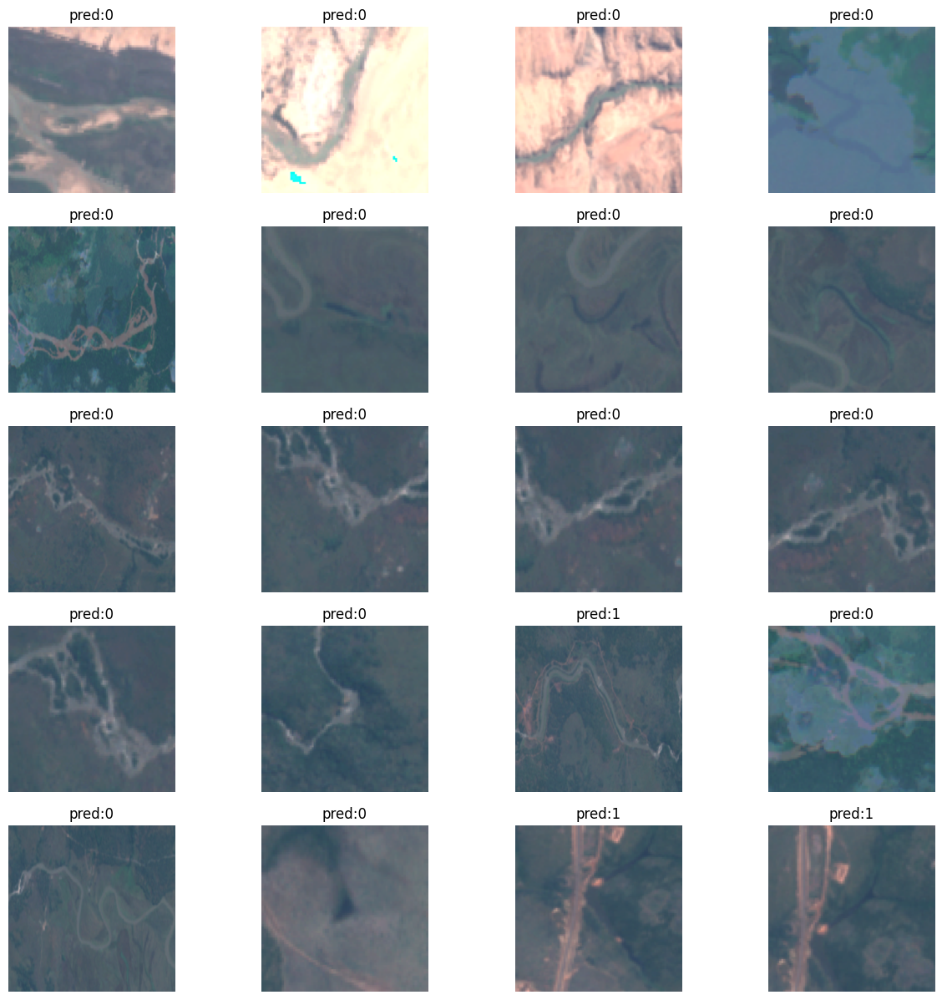

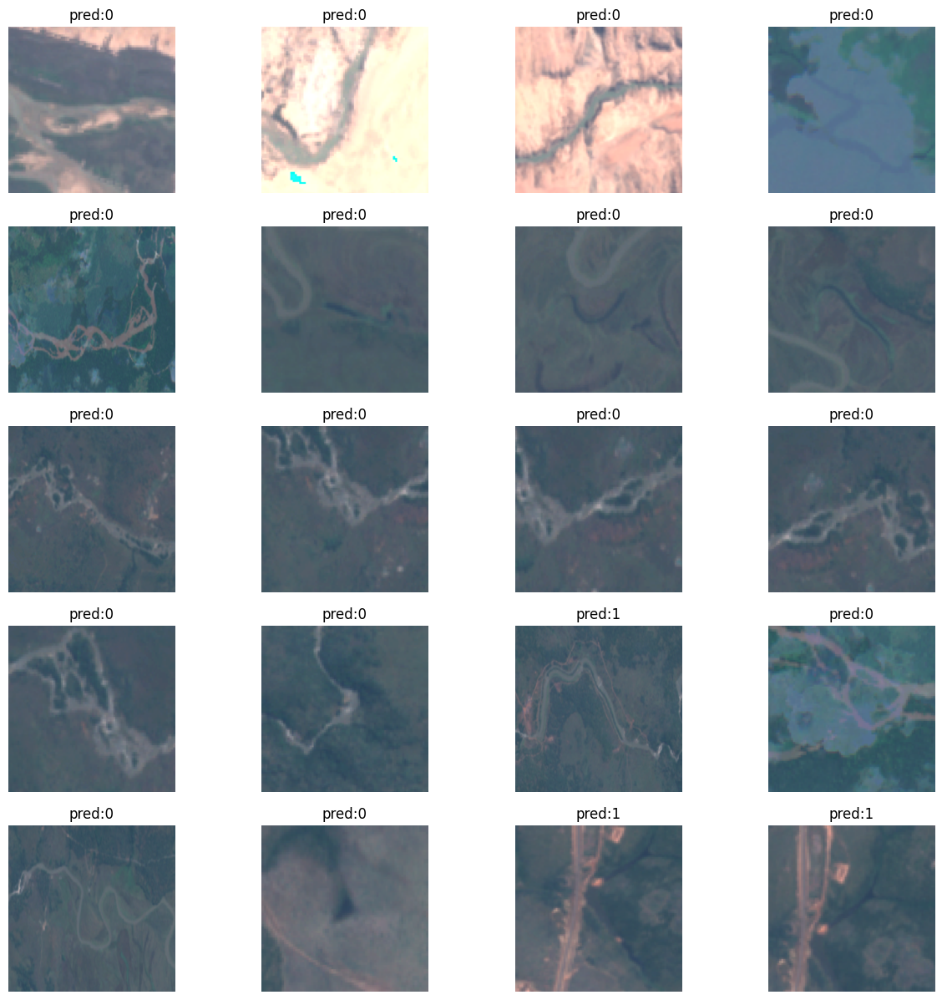

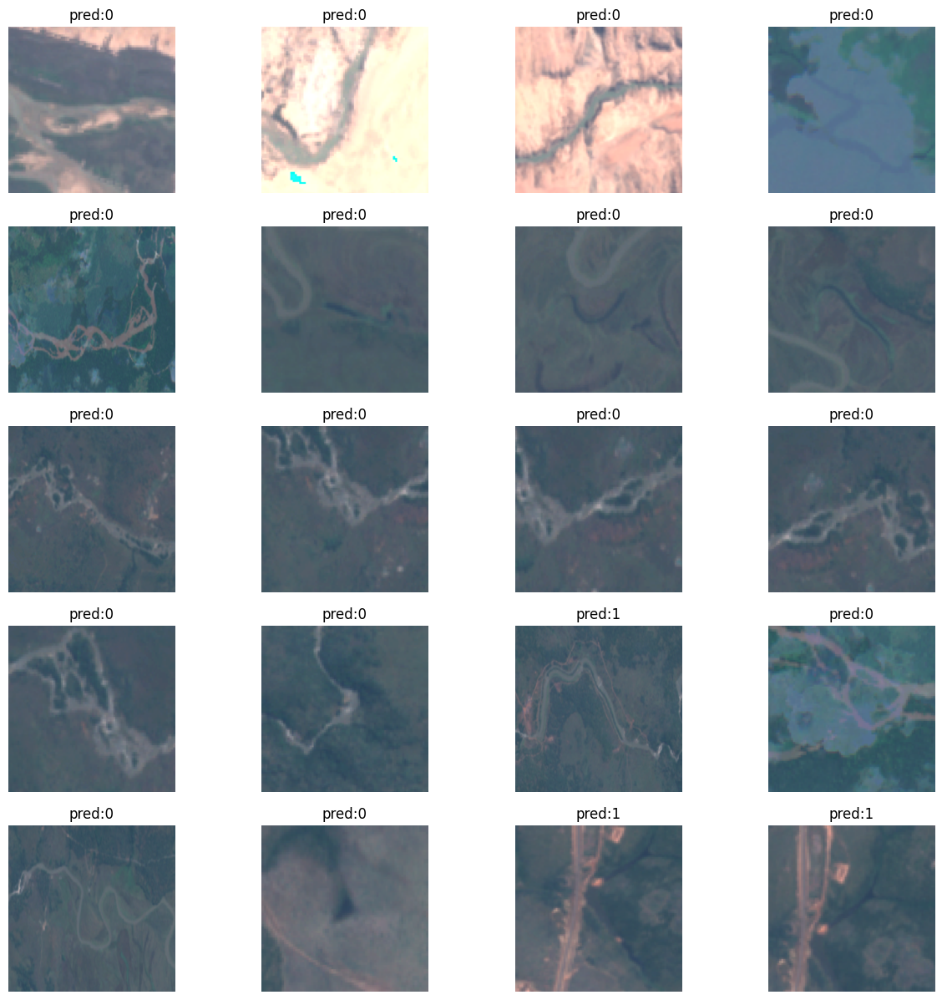

In [ ]:
for j in range(4):
  plt.figure(figsize=(15, 15))
  for images in test_dataset.take(1):
      y_pred = model.predict(images)
      y_pred_binary = np.argmax(y_pred, axis = 1)

      for i in range(20):
          ax = plt.subplot(5, 4, i + 1)
          plt.imshow(images[i].numpy())
          plt.title('pred:{}'.format(y_pred_binary[i]))
          plt.axis("off")